<a href="https://colab.research.google.com/github/QiChen000/1/blob/main/Music_Generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Generating Chinese Folk Tunes - using RNN**#


This project uses Recurrent Neural Network for Chinese Folk generation. I will train a model to learn the patterns in raw sheet in ABC notation, which generates music.
This is based on MIT Deep Learning course(https://www.youtube.com/watch?v=ySEx_Bqxvvo&list=PLtBw6njQRU-rwp5__7C0oIVt26ZgjG9NI&index=2, https://colab.research.google.com/drive/1StPoKqq57TU0SpnX4qbdELCvFunbrliP#scrollTo=rsvlBQYCrE4I)

##Dependencies
First, let's download the course repository, install dependencies, and import the relevant packages we'll need for this lab.

In [2]:
# Import Tensorflow 2.0
%tensorflow_version 2.x
import tensorflow as tf

# Download and import the MIT Introduction to Deep Learning package
!pip install mitdeeplearning
import mitdeeplearning as mdl

# Import all remaining packages
import numpy as np
import os
import time
import functools
from IPython import display as ipythondisplay
from tqdm import tqdm
!apt-get install abcmidi timidity > /dev/null 2>&1


Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 15.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for mitdeeplearning: filename=mitdeeplearning-0.3.0-py3-none-any.whl size=2117305 sha256=28d85af178c5989002b950158f7f5584920c541c4efa90c35a5da55b40d9de8b
  Stored in directory: /root/.cache/pip/wheels/9c/9f/b5/0e31f83bc60a83625e37429f923934e26802d0d68cf3ef3216
Successfully built mitdeeplearning


In [3]:
from google.colab import drive
drive.mount('/content/drive')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/pexpect/popen_spawn.py:60: DeprecationWarning: setDaemon() is deprecated, set the daemon attribute instead
  self._read_thread.setDaemon(True)


Mounted at /content/drive


#1. Dataset
The dataset is collected from (link: http://abcnotation.com/) that shows how music can be represented succinctly in across a few key dimensions: Key(scale), Beat, Notes(and melody).
This site includes resources to major contributions of various music datasets transcribed in the ABC format.
I've gathered a dataset of thousands of Chinese folk songs, represented in the ABC notation. Let's download the dataset and inspect it:https://ifdo.ca/~seymour/runabc/esac/HAN2.abc

In [4]:
txt_file = open("/content/drive/MyDrive/Colab Notebooks/Han_abc.txt", "r")
file_content = txt_file.read()


songs = file_content.split("\n\n\n")
txt_file.close()
print("The list is: ", songs)

The list is:  ["X:1\nT: Dongjia chimi wo chikang\nN: C1501\nO: China,Ã¿Sichuan, Cangxi\nS: II, 237, 1)]\nR: Shange. Suku]\nM: 2/4\nL: 1/16\nK: G\ne2e2e2ga | b6a2 | gab4a2 | g2ge-e4 |\ne2e2e2g2 | g2a2b2a2 | e2e2e2g2 | g2a2b2a2 |\ne2e2g2a2- | a6b2 | gaB2g3e | e2e6\n\nX:2\nT: Taiyang dang ding zheng dang zhong\nN: C1502\nO: China,Ã¿Sichuan, Xiushan\nS: II, 238]\nR: Shange]\nM: 2/4\nL: 1/16\nK: Bb\nf2f2 | b6c2 | f2c2e2c2 | b4f2ce | f6ef | fc3bgfz |\nf2f2f2f2 | d2f2d2c2 | f2cdf2d2 | c6b2 | e2cdcbgf |\nz4f2f2 | b6c2 | f2g2f4 | c4f2ce | f6ef | fe2cbgfz |\nf2cdf2f2 | f2f2d2c2 | f2cdf2d2 | c6b2 |\ne2cdb3g\n\nX:3\nT: Huang hua cao\nN: C1503\nO: China,Ã¿Sichuan, Xiushan\nS: II, 243]\nR: Xiaodiao]\nM: 2/4\nL: 1/8\nK: C\nAd2e | d2cA | GGFG | A4 |\ndd2e | d2cA | GGFG | A4 |\nGccG | cc2G | A2GF | D2GF | D4 |\nGc2A | GAGF | DDGF | DDz2\n\nX:4\nT: Chang shou Shange,shi mei xin\nN: C1504\nO: China,Ã¿Sichuan, Jiulong\nS: II, 249]\nR: Shange. NannÂ\x81 qing]\nM: 2/4\nL: 1/16\nK: G\nE3EA2GA | B2A6 | e4B3A 

In [5]:
example_song=songs[0]
print("\nExample song: ")
print(example_song)


Example song: 
X:1
T: Dongjia chimi wo chikang
N: C1501
O: China,Ã¿Sichuan, Cangxi
S: II, 237, 1)]
R: Shange. Suku]
M: 2/4
L: 1/16
K: G
e2e2e2ga | b6a2 | gab4a2 | g2ge-e4 |
e2e2e2g2 | g2a2b2a2 | e2e2e2g2 | g2a2b2a2 |
e2e2g2a2- | a6b2 | gaB2g3e | e2e6

X:2
T: Taiyang dang ding zheng dang zhong
N: C1502
O: China,Ã¿Sichuan, Xiushan
S: II, 238]
R: Shange]
M: 2/4
L: 1/16
K: Bb
f2f2 | b6c2 | f2c2e2c2 | b4f2ce | f6ef | fc3bgfz |
f2f2f2f2 | d2f2d2c2 | f2cdf2d2 | c6b2 | e2cdcbgf |
z4f2f2 | b6c2 | f2g2f4 | c4f2ce | f6ef | fe2cbgfz |
f2cdf2f2 | f2f2d2c2 | f2cdf2d2 | c6b2 |
e2cdb3g

X:3
T: Huang hua cao
N: C1503
O: China,Ã¿Sichuan, Xiushan
S: II, 243]
R: Xiaodiao]
M: 2/4
L: 1/8
K: C
Ad2e | d2cA | GGFG | A4 |
dd2e | d2cA | GGFG | A4 |
GccG | cc2G | A2GF | D2GF | D4 |
Gc2A | GAGF | DDGF | DDz2

X:4
T: Chang shou Shange,shi mei xin
N: C1504
O: China,Ã¿Sichuan, Jiulong
S: II, 249]
R: Shange. NannÂ qing]
M: 2/4
L: 1/16
K: G
E3EA2GA | B2A6 | e4B3A | E6z2 |
E4B3d | A4G2z2 | B4G3B | A4G2z2 | A4G2z2 |
d2

#Functions

In [6]:
import regex as re

In [7]:
def extract_song_snippet(text):
    pattern = '(^|\n\n)(.*?)\n\n'
    search_results = re.findall(pattern, text, overlapped=True, flags=re.DOTALL)
    songs = [song[1] for song in search_results]
    print("Found {} songs in text".format(len(songs)))
    return songs

def save_song_to_abc(song, filename="tmp"):
    save_name = "{}.abc".format(filename)
    with open(save_name, "w") as f:
        f.write(song)
    return filename

def abc2wav(abc_file):
    suf = abc_file.rstrip('.abc')
    cmd = "abc2midi {} -o {}".format(abc_file, suf + ".mid")
    os.system(cmd)
    cmd = "timidity {}.mid -Ow {}.wav".format(suf, suf)
    return os.system(cmd)

def play_wav(wav_file):
    return ipythondisplay.Audio(wav_file)

def play_song(song):
    basename = save_song_to_abc(song)
    ret = abc2wav(basename + '.abc')
    if ret == 0: #did not suceed
        return play_wav(basename+'.wav')
    return None

Playing the song

In [8]:
play_song(example_song)

In [9]:
# Joining our list of song strings into a single string containing all songs
songs_joined = "\n\n".join(songs)

# Finding all unique characters in the joined string
vocab = sorted(set(songs_joined))
print("There are", len(vocab), "unique characters in the dataset")

There are 84 unique characters in the dataset


#2. Processing the dataset for the learning task

###Vectorizing the text
Creating a numeric representation of our text-based dataset.
Lookup table for mapping characters to numbers and vice-versa.

In [10]:
### Define numerical representation of text ###
char_to_id={u:i for i, u in enumerate(vocab)}
id_to_char=np.array(vocab)

In [11]:
print('{')
for char,_ in zip(char_to_id, range(20)):
    print('  {:4s}: {:3d},'.format(repr(char), char_to_id[char]))
print('  ...\n}')

{
  '\n':   0,
  ' ' :   1,
  '!' :   2,
  "'" :   3,
  '(' :   4,
  ')' :   5,
  ',' :   6,
  '-' :   7,
  '.' :   8,
  '/' :   9,
  '0' :  10,
  '1' :  11,
  '2' :  12,
  '3' :  13,
  '4' :  14,
  '5' :  15,
  '6' :  16,
  '7' :  17,
  '8' :  18,
  '9' :  19,
  ...
}


In [12]:
### Vectorize the songs string ###

def vectorize_string(string):
    vectorized_output = np.array([vocab.index(char) for char in string])
    return vectorized_output

vectorized_songs = vectorize_string(songs_joined)

In [13]:
print ('{} ---- characters mapped to int ----> {}'.format(repr(songs_joined[:10]), vectorized_songs[:10]))

'X:1\nT: Don' ---- characters mapped to int ----> [47 20 11  0 43 20  1 27 67 66]


###Creating training examples and targets
We will divide the text into example sequences that we'll use during training. Each input sequence that we feed into our RNN will contain `seq_length` characters from the text. We will also define a target sequence for each input sequence, which will be used in training the RNN to predict the next character. For each input, the corresponding target will contain the same length of text, except shifted one character to the right.

We'll break the text into chunks of `seq_length+1`. Suppose `seq_length` is 4 and our text is "Panda". Then, our input sequence is "Pand" and the target sequence is "anda".

The batch method will then let us convert this stream of character indices to sequences of the desired size.

In [14]:
def get_batch(vectorized_songs, seq_length, batch_size):
  # the length of the vectorized songs string
  n = vectorized_songs.shape[0] - 1
  # randomly choose the starting indices for the examples in the training batch
  idx = np.random.choice(n-seq_length, batch_size)

  #a list of input sequences for the training batch
  input_batch = [vectorized_songs[i : i+seq_length] for i in idx]
  #a list of output sequences for the training batch
  output_batch = [vectorized_songs[i+1 : i+seq_length+1] for i in idx]

  # x_batch, y_batch provide the true inputs and targets for network training
  x_batch = np.reshape(input_batch, [batch_size, seq_length])
  y_batch = np.reshape(output_batch, [batch_size, seq_length])
  return x_batch, y_batch


For each of these vectors, each index is processed at a single time step. So, for the input at time step 0, the model receives the index for the first character in the sequence, and tries to predict the index of the next character. At the next timestep, it does the same thing, but the RNN considers the information from the previous step, i.e., its updated state, in addition to the current input.


In [15]:
x_batch, y_batch = get_batch(vectorized_songs, seq_length=5, batch_size=1)

for i, (input_idx, target_idx) in enumerate(zip(np.squeeze(x_batch), np.squeeze(y_batch))):
    print("Step {:3d}".format(i))
    print("  input: {} ({:s})".format(input_idx, repr(id_to_char[input_idx])))
    print("  expected output: {} ({:s})".format(target_idx, repr(id_to_char[target_idx])))

Step   0
  input: 37 ('N')
  expected output: 20 (':')
Step   1
  input: 20 (':')
  expected output: 1 (' ')
Step   2
  input: 1 (' ')
  expected output: 26 ('C')
Step   3
  input: 26 ('C')
  expected output: 11 ('1')
Step   4
  input: 11 ('1')
  expected output: 16 ('6')


#3. The Recurrent Neural Network (RNN) model


We'll train our RNN using batches of song snippets from our dataset, which we have already generated.
The model we'll create will be based on LSTM architecture, where we will use state vector to maintain information about the temporal relationships between consecutive characters. The final output of the LSTM is then fed into a fully connected Dense layer where we'll output a softmax over each character in the vocabulary, and then sample from this distribution to predict the next character.

we'll be using the Keras API, specifically, tf.keras.Sequential, to define the model. Three layers are used to define the model:

Layer 1: Embedding layer to transform indices into dense vectors of a fixed embedding size

Layer 2: LSTM with `rnn_units` number of units.

Layer 3: Dense (fully-connected) layer that transforms the LSTM output into the vocabulary size.

##Defining the model

In [16]:
def LSTM(rnn_units):
  return tf.keras.layers.LSTM(
    rnn_units,
    return_sequences=True,
    recurrent_initializer='glorot_uniform',
    recurrent_activation='sigmoid',
    stateful=True,
  )

In [17]:
def build_model(vocab_size, embedding_dim, rnn_units, batch_size):
  model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, batch_input_shape=[batch_size, None]),
    LSTM(rnn_units),
    tf.keras.layers.Dense(vocab_size)
  ])

  return model


model = build_model(len(vocab), embedding_dim=256, rnn_units=1024, batch_size=32)

###Testing our model

In [18]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (32, None, 256)           21504     
                                                                 
 lstm (LSTM)                 (32, None, 1024)          5246976   
                                                                 
 dense (Dense)               (32, None, 84)            86100     
                                                                 
Total params: 5,354,580
Trainable params: 5,354,580
Non-trainable params: 0
_________________________________________________________________


In [19]:
x, y = get_batch(vectorized_songs, seq_length=100, batch_size=32)
pred = model(x)
print("Input shape:      ", x.shape, " # (batch_size, sequence_length)")
print("Prediction shape: ", pred.shape, "# (batch_size, sequence_length, vocab_size)")

Input shape:       (32, 100)  # (batch_size, sequence_length)
Prediction shape:  (32, 100, 84) # (batch_size, sequence_length, vocab_size)


###Predictions from the untrained model

In [20]:
sampled_indices = tf.random.categorical(pred[0], num_samples=1)
sampled_indices = tf.squeeze(sampled_indices,axis=-1).numpy()
sampled_indices

array([ 2, 79, 39, 79, 68, 29, 27, 44,  3, 72, 63, 12, 46, 37, 43, 28, 39,
       26, 64, 38,  3, 14, 82, 28, 52, 18, 62, 15, 53, 79, 78, 77,  5,  8,
       42, 61, 42, 69, 57, 20,  3, 34, 31, 46, 34, 39, 33, 35, 58, 23, 42,
        0, 27, 22, 45, 63, 25, 17, 26, 14, 44, 16, 27, 83, 20, 74, 53, 64,
       76,  4, 27, 64, 28, 15, 26, 35, 19, 61, 55, 30, 20, 50, 65, 78, 66,
        1, 26, 22, 16, 27, 34, 26, 47, 44,  0, 71, 42, 33, 83,  6])

In [21]:
print("Input: \n", repr("".join(id_to_char[x[0]])))
print()
print("Next Char Predictions: \n", repr("".join(id_to_char[sampled_indices])))

Input: 
 'DEG4 | GABdA3B | E2GDE3D | D8\n\nX:630\nT: Xingjunge\nN: C2151\nO: China,Ã¿Hubei Dawu\nS: I, 402]\nR: Xiaod'

Next Char Predictions: 
 "!|P|pFDU'tk2WNTEPClO'4ÂE_8j5a|zy).SiSqe:'KHWKPJLf?S\nD=VkB7C4U6DÃ:valx(DlE5CL9icG:]mzn C=6DKCXU\nsSJÃ,"


#4. Training the model: loss and training operations
To train our model, we can use a form of the crossentropy loss (negative log likelihood loss)i.e., sparse_categorical_crossentropy loss, as it utilizes integer targets for categorical classification tasks. We will want to compute the loss using the true targets -- the labels -- and the predicted targets -- the logits.

Computing loss from untrained model:

In [22]:
### Defining the loss function ###

def compute_loss(labels, logits):
   loss = tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)
   return loss

true_labels = [1, 2, 0, 1, 2]
predictions = [[0.1, 0.2, 0.7], [0.3, 0.4, 0.3], [0.8, 0.1, 0.1], [0.2, 0.5, 0.3], [0.4, 0.1, 0.5]]

example_batch_loss = compute_loss(true_labels, predictions)

print("Prediction shape: ", pred.shape, " # (batch_size, sequence_length, vocab_size)")
print("scalar_loss:      ", example_batch_loss.numpy().mean())

Prediction shape:  (32, 100, 84)  # (batch_size, sequence_length, vocab_size)
scalar_loss:       0.9952973


Defining hyperparameters for training the model:

In [23]:
### Hyperparameter setting and optimization ###

# Optimization parameters:
num_training_iterations = 3000
batch_size = 10
seq_length = 100
learning_rate = 1e-3

# Model parameters:
vocab_size = len(vocab)
embedding_dim = 256
rnn_units = 1024

# Checkpoint location:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "my_ckpt")

We are using Adam optimizer(Adagrad optimizer can also be used)


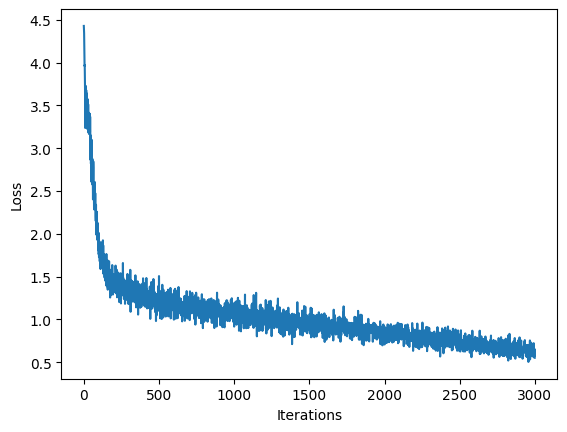

100%|██████████| 3000/3000 [3:34:30<00:00,  4.29s/it]


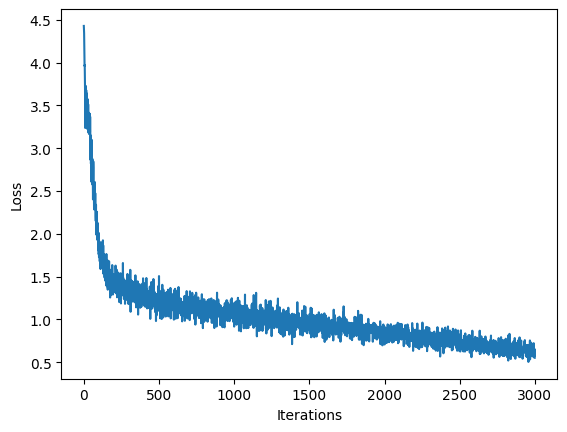

In [24]:
  ### Defining optimizer and training operation ###


model = build_model(vocab_size, embedding_dim, rnn_units, batch_size)

optimizer = tf.keras.optimizers.Adam(learning_rate)

@tf.function
def train_step(x, y):
  # Using tf.GradientTape()
   with tf.GradientTape() as tape:

    y_hat = model(x)

    loss = compute_loss(y, y_hat)

  # Now, computing the gradients

   grads = tape.gradient(loss, model.trainable_variables)

  # Applying the gradients to the optimizer so it can update the model accordingly
   optimizer.apply_gradients(zip(grads, model.trainable_variables))
   return loss

##################
# Begin training!#
##################

history = []
plotter = mdl.util.PeriodicPlotter(sec=2, xlabel='Iterations', ylabel='Loss')
if hasattr(tqdm, '_instances'): tqdm._instances.clear() # clear if it exists

for iter in tqdm(range(num_training_iterations)):

  # Grabing a batch and propagating it through the network
   x_batch, y_batch = get_batch(vectorized_songs, seq_length, batch_size)
   loss = train_step(x_batch, y_batch)

  # Update the progress bar
   history.append(loss.numpy().mean())
   plotter.plot(history)

  # Update the model with the changed weights!
  if iter % 100 == 0:
    model.save_weights(checkpoint_prefix)

# Save the trained model and the weights
  model.save_weights(checkpoint_prefix)


#5. Generating music using the RNN model

##Restore the latest checkpoint
To keep this inference step simple, we will use a batch size of 1. Because of how the RNN state is passed from timestep to timestep, the model will only be able to accept a fixed batch size once it is built.
To run the model with a different batch_size, we'll need to rebuild the model and restore the weights from the latest checkpoint, i.e., the weights after the last checkpoint during training:

In [25]:
model = build_model(vocab_size, embedding_dim, rnn_units, batch_size=1)

# Restore the model weights for the last checkpoint after training
model.load_weights(tf.train.latest_checkpoint(checkpoint_dir))
model.build(tf.TensorShape([1, None]))

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (1, None, 256)            21504     
                                                                 
 lstm_2 (LSTM)               (1, None, 1024)           5246976   
                                                                 
 dense_2 (Dense)             (1, None, 84)             86100     
                                                                 
Total params: 5,354,580
Trainable params: 5,354,580
Non-trainable params: 0
_________________________________________________________________


##The prediction procedure

Step 1: Initialize a "seed" start string and the RNN state, and set the number of characters we want to generate.

Step2: Use the start string and the RNN state to obtain the probability distribution over the next predicted character.

Step3: Sample from multinomial distribution to calculate the index of the predicted character. This predicted character is then used as the next input to the model.

Step 4: At each time step, the updated RNN state is fed back into the model, so that it now has more context in making the next prediction. After predicting the next character, the updated RNN states are again fed back into the model, which is how it learns sequence dependencies in the data, as it gets more information from the previous predictions.

In [26]:
### Prediction of a generated song ###

def generate_text(model, start_string, generation_length=1000):
  # Evaluation step (generating ABC text using the learned RNN model)

  #converting the start string to numbers (vectorize)
  input_eval = [char_to_id[s] for s in start_string]
  input_eval = tf.expand_dims(input_eval, 0)

  # Empty string to store our results
  text_generated = []

  # Here batch size == 1
  model.reset_states()
  tqdm._instances.clear()

  for i in tqdm(range(generation_length)):
      #evaluating the inputs and generate the next character predictions
      predictions = model(input_eval)

      # Remove the batch dimension
      predictions = tf.squeeze(predictions, 0)

      #using a multinomial distribution to sample
      predicted_id = tf.random.categorical(predictions, num_samples=1)[-1,0].numpy()

      # Pass the prediction along with the previous hidden state as the next inputs to the model

      input_eval = tf.expand_dims([predicted_id], 0)

      #adding the predicted character to the generated text!
      text_generated.append(id_to_char[predicted_id])

  return (start_string + ''.join(text_generated))

In [27]:
#using the model and the function defined above to generate ABC format text of length 1000!

generated_text = generate_text(model, start_string="C", generation_length=1000)


100%|██████████| 1000/1000 [00:19<00:00, 50.60it/s]


##Play back the generated music!


In [28]:
### Play back generated songs ###

generated_songs = extract_song_snippet(generated_text)

for i, song in enumerate(generated_songs):
  # Synthesize the waveform from a song
  waveform = play_song(song)

  # If its a valid song (correct syntax), lets play it!
  if waveform:
    print("Generated song", i)
    ipythondisplay.display(waveform)

Found 3 songs in text
Generated song 0


Generated song 1


Generated song 2
